# Exploring GeoGuessr with TensorFlow and MobileNetV2
## Introduction

Geography and exploration have always been fascinating aspects of human curiosity. The ability to identify a location based on visual cues is a skill that humans excel at. In the modern era, technology has brought us tools like Google Street View, which allows us to virtually explore the world from the comfort of our homes. GeoGuessr, a popular online game, capitalizes on this by presenting players with a random Google Street View image and challenging them to pinpoint its location on a map.

In this Jupyter Notebook, we delve into the realm of GeoGuessr, not as players, but as aspiring machine learning enthusiasts. Our goal is to harness the power of deep learning to tackle the GeoGuessr challenge. Specifically, we aim to train a convolutional neural network (CNN) to predict the country in which a given Street View image is located. To achieve this, we'll be using TensorFlow and Keras, with the MobileNetV2 architecture as our base model.

While the idea of teaching a machine to recognize countries from images seems promising, we must acknowledge that the road to success is often paved with challenges. Our journey may not yield the triumphant results we hope for, but the process itself is a valuable learning experience. We'll not only explore how to prepare data and build a neural network but also how to interpret and visualize the network's decision-making process. This transparency might shed light on where the network struggles and offer insights into potential improvements.

So, with a realistic mindset and a curious spirit, let's dive into the world of GeoGuessr, neural networks, and the intricate interplay between man and machine in the realm of geographical identification.

## Install the dependencies

In [1]:
import sys
!{sys.executable} -m pip install tensorflow==2.11.0 opendatasets==0.1.22 pillow==9.0.1 matplotlib==3.5.3 numpy==1.21.5 tensorboard==2.11.2 scikit-learn==1.2.2 opencv-python==4.6.0.66

Defaulting to user installation because normal site-packages is not writeable


## Import libraries

In [1]:
import os
import datetime
import opendatasets as od
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import preprocessing, optimizers, losses, layers, callbacks, applications
import cv2

2023-08-31 23:43:29.111392: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-31 23:43:29.744821: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.8/lib64:
2023-08-31 23:43:29.744883: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.8/lib64:
2023-08-31 23:43:29.744889: W tensorflow/compiler/tf2tensorrt/utils/py_uti

## The Dataset
As any machine learning endeavor begins with data, our journey into the world of GeoGuessr starts with a comprehensive dataset. Instead of embarking on the time-consuming path of manually scraping Google Street View images and meticulously labeling them, we've opted for a more efficient route. A dataset containing 50,000 images, each labeled with the corresponding country, was discovered on Kaggle. This dataset aligns well with our learning objectives, as our focus lies on computer vision and model development rather than data gathering.

The pre-structured nature of the dataset provides us with a head start. Each image is associated with its respective country label, which significantly reduces the groundwork needed to prepare the data for training. This allows us to dedicate more time and effort to the core aspects of the project, such as building and fine-tuning the neural network architecture. While using a readily available dataset might have certain limitations, it serves as a practical trade-off in the context of this computer vision-focused exploration.

In [3]:
# Simply download with opendatasets
# You might need to give your Kaggle api key the first time
od.download("https://www.kaggle.com/datasets/ubitquitin/geolocation-geoguessr-images-50k")

Skipping, found downloaded files in "./geolocation-geoguessr-images-50k" (use force=True to force download)


## Familiarizing Ourselves with the Dataset
### Understanding the Images

Before delving into the complexities of model training, it's crucial to familiarize ourselves with the dataset. The 50,000 images span a diverse array of geographical locations, each representing a different country. Let's take a moment to examine one of these images closely. Here's a snapshot of what the dataset images generally look like:

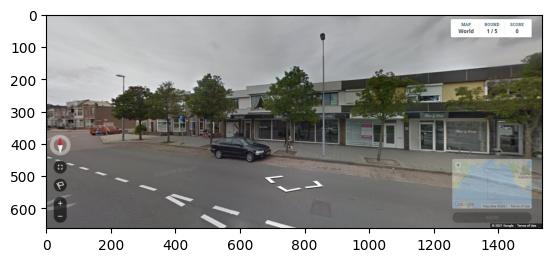

(662, 1536, 3)


In [2]:
img = Image.open("geolocation-geoguessr-images-50k/compressed_dataset/Netherlands/canvas_1629257895.jpg")
plt.imshow(img)
plt.show()
print(np.array(img).shape)

In this sample image, we can observe the overlay of Google Street View's interface, providing an immersive view of the surroundings. We have enough resolution that we could chop off the left and right side.

### Data Preprocessing and Train-Test Split
While the dataset's structure simplifies our initial steps, some preprocessing is necessary to ensure compatibility with our chosen neural network architecture. In this case, we'll focus on cropping the images to remove any non-essential interface elements. This step streamlines the input for the model and enhances its ability to extract relevant features. Additionally, to evaluate the model's performance objectively, we'll split the dataset into training and testing subsets. This separation allows us to train the model on one subset and assess its generalization on the other, providing insights into potential overfitting issues.

Found 49997 files belonging to 124 classes.
Using 39998 files for training.


2023-08-31 23:43:39.105922: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-08-31 23:43:39.126699: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-08-31 23:43:39.126885: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-08-31 23:43:39.127333: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

Found 49997 files belonging to 124 classes.
Using 9999 files for validation.
(20, 662, 964, 3) (20, 124)


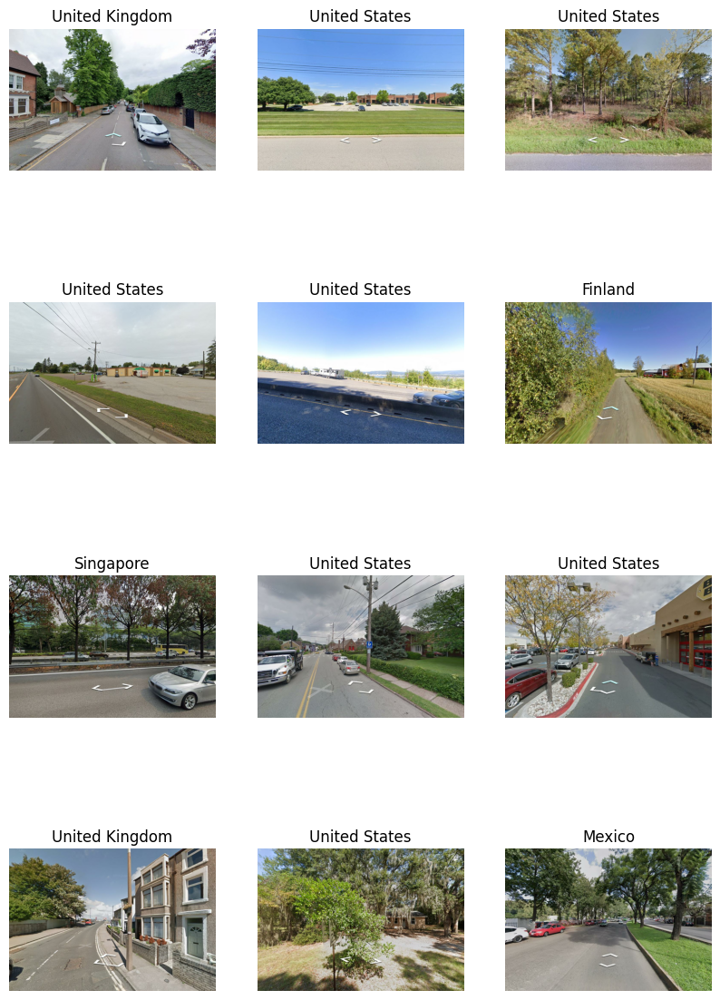

In [3]:
def custom_crop(image, label):
    # Crop the horizontal ends off
    return image[:, :, 286:1250, :], label

uncropped_train_ds = preprocessing.image_dataset_from_directory(
    "geolocation-geoguessr-images-50k/compressed_dataset",
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=20,
    image_size=(662, 1536),
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="training",
)
train_ds = uncropped_train_ds.map(custom_crop)

val_ds = preprocessing.image_dataset_from_directory(
    "geolocation-geoguessr-images-50k/compressed_dataset",
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=20,
    image_size=(662, 1536),
    shuffle=True,
    seed=42,
    validation_split=0.2,
    subset="validation",
).map(custom_crop)

train_images_batch, train_labels_batch = next(train_ds.as_numpy_iterator())
print(train_images_batch.shape, train_labels_batch.shape)
# Show the first 9 images from the batch with their labels
plt.figure(figsize=(10, 15))
for i in range(12):
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(train_images_batch[i] / 255.0)
    plt.title(uncropped_train_ds.class_names[train_labels_batch[i].argmax()])
    plt.axis("off")

### Analyzing Label Frequencies
Upon closer examination of the dataset, we observe that the distribution of labels (countries) is not balanced. Some countries have a significant number of samples, while others are comparatively rare. To mitigate the impact of label imbalance during training, we assign class weights based on the frequencies. This means that rarer classes will be assigned heavier weights, allowing the model to give more importance to these less-represented classes. The following plot illustrates the frequency distribution of the labels, highlighting the varying occurrences of different countries in the dataset.

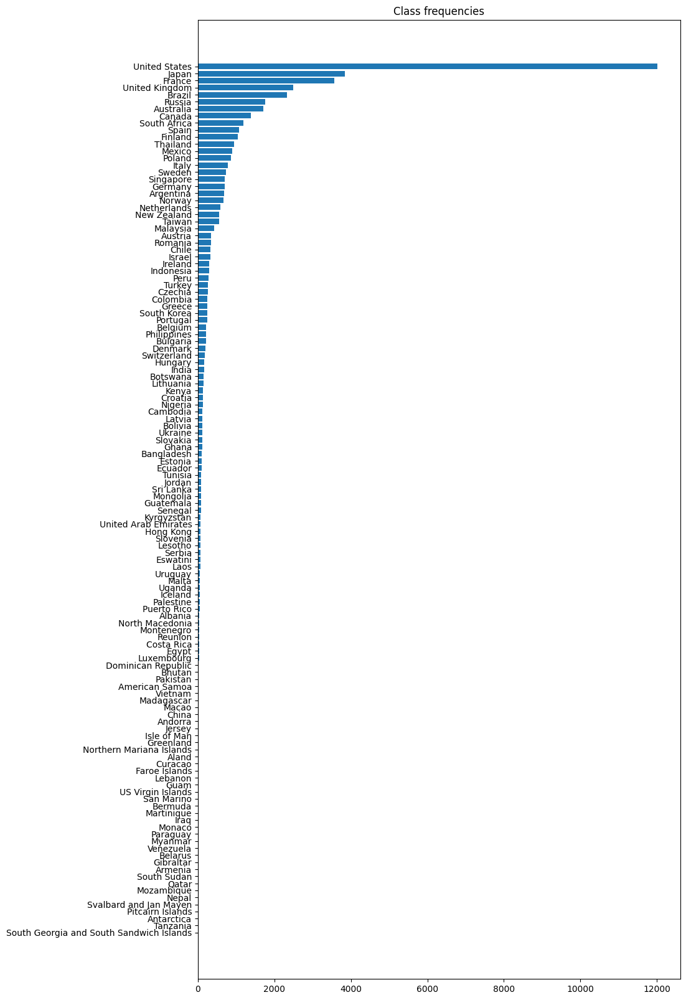

{'South Georgia and South Sandwich Islands': 1, 'Tanzania': 1, 'Antarctica': 1, 'Pitcairn Islands': 1, 'Svalbard and Jan Mayen': 1, 'Nepal': 1, 'Mozambique': 1, 'Qatar': 1, 'South Sudan': 1, 'Armenia': 1, 'Gibraltar': 1, 'Belarus': 1, 'Venezuela': 1, 'Myanmar': 2, 'Paraguay': 2, 'Monaco': 2, 'Iraq': 2, 'Martinique': 2, 'Bermuda': 3, 'San Marino': 4, 'US Virgin Islands': 6, 'Guam': 8, 'Lebanon': 8, 'Faroe Islands': 9, 'Curacao': 9, 'Aland': 9, 'Northern Mariana Islands': 10, 'Greenland': 11, 'Isle of Man': 11, 'Jersey': 12, 'Andorra': 13, 'China': 13, 'Macao': 13, 'Madagascar': 13, 'Vietnam': 15, 'American Samoa': 16, 'Pakistan': 19, 'Bhutan': 20, 'Dominican Republic': 22, 'Luxembourg': 25, 'Egypt': 27, 'Costa Rica': 27, 'Reunion': 29, 'Montenegro': 32, 'North Macedonia': 35, 'Albania': 41, 'Puerto Rico': 46, 'Palestine': 46, 'Iceland': 54, 'Uganda': 55, 'Malta': 55, 'Uruguay': 57, 'Laos': 61, 'Eswatini': 62, 'Serbia': 62, 'Lesotho': 65, 'Slovenia': 66, 'Hong Kong': 66, 'United Arab Emi

In [4]:
class_names = os.listdir("geolocation-geoguessr-images-50k/compressed_dataset")
frequencies = {class_name: len(os.listdir("geolocation-geoguessr-images-50k/compressed_dataset/" + class_name)) for class_name in class_names}
# Sort the dictionary by value in descending order
frequencies = {k: v for k, v in sorted(frequencies.items(), key=lambda item: item[1])}
# Use matplotlib to make a horizontal bar plot of the frequencies ordered from highest to lowest
fig, ax = plt.subplots(figsize=(10, 20))
ax.barh(list(frequencies.keys()), frequencies.values())
ax.set_title("Class frequencies")
plt.show()
print(frequencies)

By applying class weights, we aim to alleviate potential biases that could emerge due to the skewed distribution of labels, enhancing the overall performance of our model across all countries, including those that might be less commonly encountered in the dataset.

In [5]:
class_weights = {i: 1 / frequencies[class_name] for i, class_name in enumerate(uncropped_train_ds.class_names)}

## Building the Model

To tackle the GeoGuessr challenge of predicting the country based on Street View images, we'll employ the MobileNetV2 architecture as our foundation. MobileNetV2 is known for its efficiency and effectiveness in image classification tasks, making it a suitable candidate for our project. However, rather than training the entire architecture from scratch, we'll leverage the power of transfer learning.

Transfer learning involves taking a pre-trained model, in this case, MobileNetV2, and fine-tuning it for our specific task. We'll retain the weights of the base MobileNetV2 model, which were trained on the ImageNet dataset, a massive collection of images spanning a multitude of categories. This decision serves two main purposes:

- Faster Training: Pre-trained models have already learned to recognize a wide range of features in images. By initializing our model with these learned weights, we provide a head start to our network. This results in faster convergence during training and often requires fewer epochs to achieve decent performance.

- Feature Extraction and Global Average Pooling: MobileNetV2 includes a Global Average Pooling (GAP) layer before the final classification layer. This GAP layer condenses the spatial dimensions of the feature maps, reducing the number of parameters in the subsequent dense layers. This design makes the network more lightweight and less prone to overfitting.

In our specific case, we'll replace the final classification layer of MobileNetV2 with a new dense layer tailored to our task. This dense layer will have the same number of neurons as the classes we need to predict (countries). Only the weights of this new dense layer will be trained during our training process.

This approach is advantageous not only because it allows us to take advantage of the pre-trained MobileNetV2's feature extraction capabilities but also because it leads to significantly faster training times compared to training an entire network from scratch. Additionally, since MobileNetV2 includes a Global Average Pooling layer, it will later enable us to create Class Activation Maps (CAMs) to visualize where the model is focusing its attention when making predictions. We'll delve into this visualization technique in subsequent sections.

In [6]:
base_model = applications.MobileNetV2(
    input_shape=(662, 964, 3),
    include_top=False,
    weights="imagenet"
)
base_model.trainable = False
inputs = tf.keras.Input(shape=(662, 964, 3))
base_model_outputs = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(base_model_outputs)
x = layers.Dense(124)(x)
outputs = layers.Softmax()(x)
model = tf.keras.Model(inputs, outputs)
multi_output_model = tf.keras.Model(
    inputs=inputs,
    outputs=(
        base_model_outputs,
        outputs
    )
)
model.compile(
    # This source says that 1.66 * 10^-3 is a good learning rate for transfer learning with MobileNetV2
    # https://www.researchgate.net/publication/343841421_A_Distributed_Architecture_for_Smart_Recycling_Using_Machine_Learning#pf9
    optimizer=optimizers.Adam(learning_rate=0.00166),
    loss=losses.CategoricalCrossentropy(),
    metrics=["accuracy"]
)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 662, 964, 3)]     0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 21, 31, 1280)     2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 124)               158844    
                                                                 
 softmax (Softmax)           (None, 124)               0         
                                                                 
Total params: 2,416,828
Trainable params: 158,844
Non-trainab

Now that our model's architecture is set, let's move on to the training phase and witness how well our model learns to decipher the geographical nuances embedded within the Street View images.

## Training the Model
### Tensorboard

Before we embark on the training journey, it's prudent to establish a mechanism to monitor and compare the progress of our model. To achieve this, we set up a TensorBoard session. TensorBoard is a powerful visualization tool offered by TensorFlow that allows us to track various metrics during training, enabling us to gain insights into the model's performance, loss trends, and other relevant statistics. By using TensorBoard, we aim to make informed decisions about model hyperparameters and configurations.

Let's set up the TensorBoard session and configure it to log relevant information about the training process:

In [1]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

Launching TensorBoard...

### Fitting
With the TensorBoard session ready, we move on to the actual fitting. We'll train the model for 50 epochs, with a batch size of 32. We'll also use the validation data to monitor the model's performance on unseen data during training. This will help us identify potential overfitting issues and adjust the model's hyperparameters accordingly.  
In the end, we'll save the model's weights to a file, which we can later load to make predictions on new images.

In [12]:
run_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = callbacks.TensorBoard(log_dir="logs/", histogram_freq=1, update_freq=1)

try:
    history = model.fit(
        train_ds,
        epochs=50,
        validation_data=val_ds,
        validation_steps=100,
        callbacks=[tensorboard_callback],
        class_weight=class_weights
    )
except KeyboardInterrupt:
    pass
finally:
    # save the checkpoint even if the training is interrupted
    if not os.path.exists("checkpoints"):
        os.mkdir("checkpoints")
    model.save(f"checkpoints/{run_name}.h5")

Epoch 1/50


2023-08-30 23:43:13.860898: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f937194cf60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-08-30 23:43:13.861015: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce GTX 1060 6GB, Compute Capability 6.1
2023-08-30 23:43:13.875296: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-08-30 23:43:14.262639: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2000/2000 [==============================] - 1079s 538ms/step - loss: 0.0146 - accuracy: 0.0169 - val_loss: 4.4887 - val_accuracy: 0.0145
Epoch 2/50
2000/2000 [==============================] - 1087s 543ms/step - loss: 0.0111 - accuracy: 0.0421 - val_loss: 5.2165 - val_accuracy: 0.0090
Epoch 3/50
2000/2000 [==============================] - 1086s 543ms/step - loss: 0.0095 - accuracy: 0.0618 - val_loss: 4.4091 - val_accuracy: 0.0490
Epoch 4/50
2000/2000 [==============================] - 1087s 543ms/step - loss: 0.0082 - accuracy: 0.0813 - val_loss: 3.8065 - val_accuracy: 0.1120
Epoch 5/50
2000/2000 [==============================] - 1086s 542ms/step - loss: 0.0075 - accuracy: 0.0955 - val_loss: 3.8351 - val_accuracy: 0.1190
Epoch 6/50
2000/2000 [==============================] - 1087s 543ms/step - loss: 0.0069 - accuracy: 0.1130 - val_loss: 3.8653 - val_accuracy: 0.1250
Epoch 7/50
2000/2000 [==============================] - 1086s 542ms/step - loss: 0.0065 - accuracy: 0.1248 - val_loss

## Training results
![Accuracy during the training process from tensorboard](accuracy_training.png)  
After a series of training sessions, each characterized by adjustments and experimentation, we have obtained the following training results:

Final Results:

    Loss: 0.0024
    Accuracy: 0.3397
    Validation Loss: 3.1861
    Validation Accuracy: 0.2450

Considering the complexity of the task—predicting the country from a diverse range of Street View images—we can reflect on the progress we've made. While a 24.5% validation accuracy might not appear impressive at first glance, it's crucial to contextualize this result. With 125 classes (countries), random guessing would yield a mere 0.8% accuracy. Thus, our model's ability to discern patterns in the images and achieve a substantially higher accuracy is an accomplishment in itself.

It's worth noting that the imbalanced distribution of classes, especially the dominance of the USA, posed challenges. However, our approach of assigning class weights has contributed to mitigating the bias introduced by this skew.

Throughout the journey, we encountered obstacles related to GPU support and training time. One key takeaway is the impact of patience on training outcomes. As demonstrated by the stark difference between the initial and final results, allowing the model to train for an extended period can lead to significant improvements. Our final training session, which spanned 50 epochs and approximately 12.5 hours on a GTX 1060, showcased the potential of persistence in refining our model's performance.

In [11]:
model = tf.keras.models.load_model("25accuracy.h5")
multi_output_model = tf.keras.models.load_model("multi_output_model.h5")

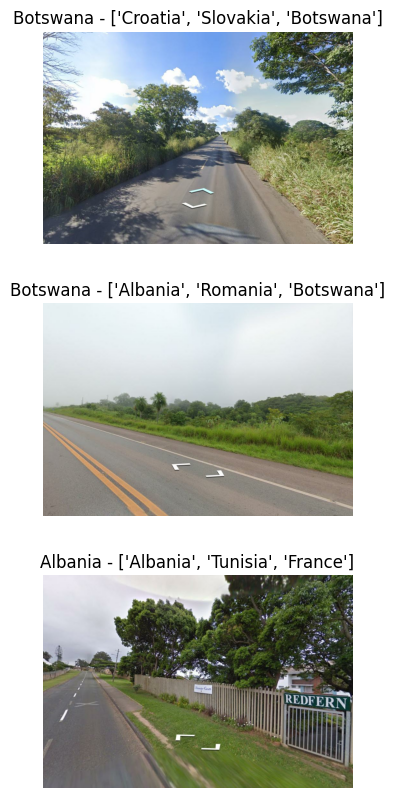

In [10]:
val_images_batch, val_labels_batch = next(val_ds.as_numpy_iterator())
predictions = model(val_images_batch[:3])

# Show the first 3 images from the batch with their labels
plt.figure(figsize=(4, 10))
for i in range(3):
    ax = plt.subplot(3, 1, i + 1)
    plt.imshow(val_images_batch[i] / 255.0)
    plt.title(f"{class_names[val_labels_batch[i].argmax()]} - {[x for x, _ in sorted(zip(class_names, predictions[i]), key=lambda x: x[1], reverse=True)][:3]}")
    plt.axis("off")

Here we see a sample of 3 images from the validation set, along with the model's predictions for each image. The model's top 3 predictions are shown. The correct answer is on the left.

## Visualizing with Class Activation Maps (CAMs)

Understanding what aspects of an image the neural network focuses on during its decision-making process can be crucial for refining and interpreting the model's performance. Class Activation Maps (CAMs) offer an insightful technique for achieving this by highlighting the regions of an image that contribute most to a particular class prediction. These heatmaps effectively show the "attention" of the model and provide clues about the visual cues that guide its decisions.

The concept behind CAMs is relatively straightforward. In our MobileNetV2-based model, the final convolutional layer before the global average pooling and classification layers is the one that captures high-level features learned from the data. By using the weights of this layer, we can compute a weighted sum of feature maps to create a heatmap that highlights the regions of interest in an image.

However, in practice, there can be challenges in generating meaningful CAMs. If the CAMs fail to exhibit the expected patterns—such as highlighting geographical cues like vegetation, road markings, or architecture—it could indicate that the model's learning process might not be effectively leveraging these cues. There might be several reasons for this discrepancy, ranging from model complexity to dataset limitations.

We've attempted to generate CAMs for a subset of 20 images, focusing on highlighting the "United States" portion of the images. However, despite confirming the mathematical implementation, the resulting heatmaps did not align with our expectations. An intriguing pattern emerged, where the hard edges of the images seemed to disproportionately trigger neurons, leading to less meaningful visualizations.

1/1 [==============================] - 0s 21ms/step


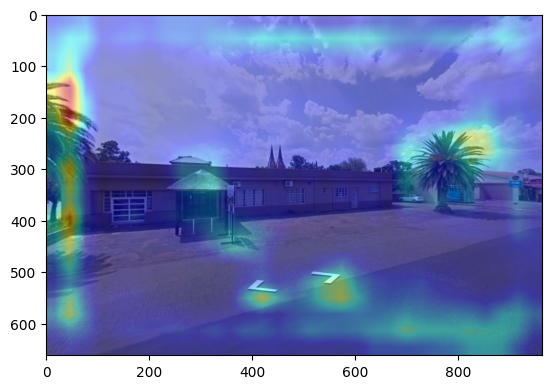

1/1 [==============================] - 0s 19ms/step


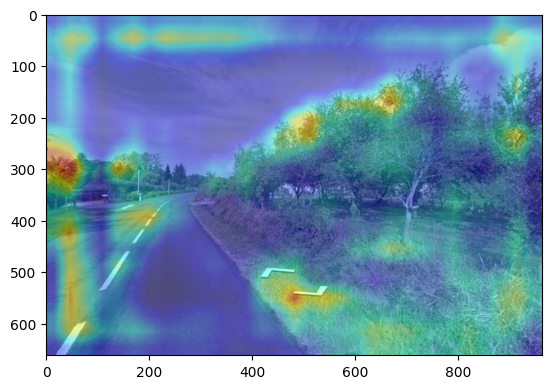

1/1 [==============================] - 0s 21ms/step


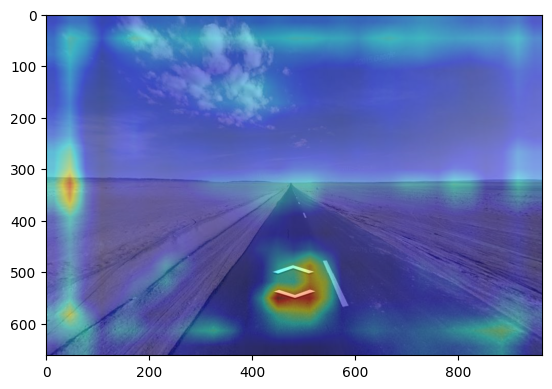

1/1 [==============================] - 0s 21ms/step


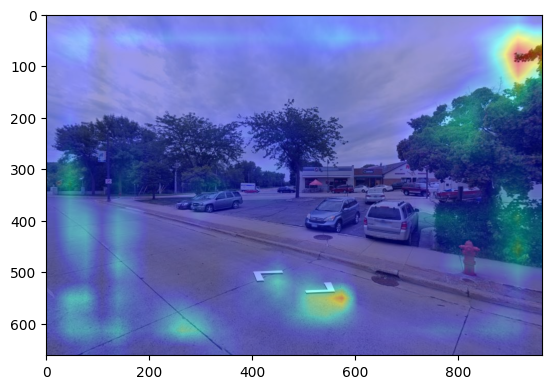

1/1 [==============================] - 0s 24ms/step


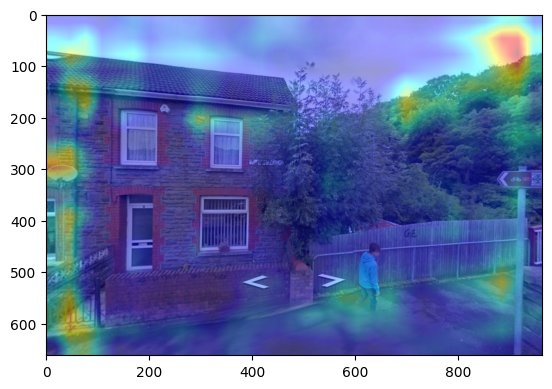

1/1 [==============================] - 0s 27ms/step


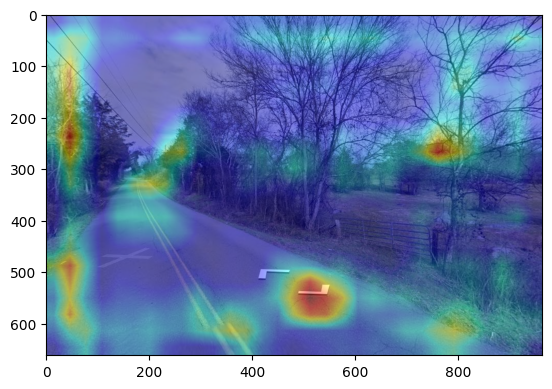

1/1 [==============================] - 0s 20ms/step


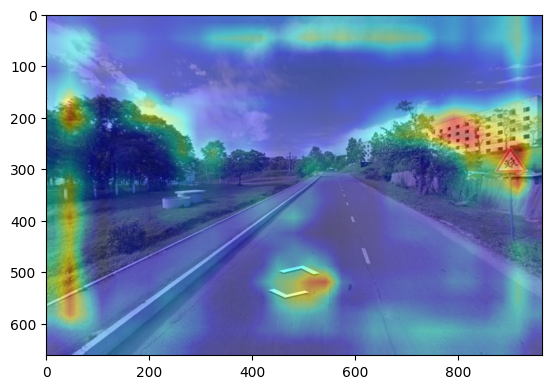

1/1 [==============================] - 0s 21ms/step


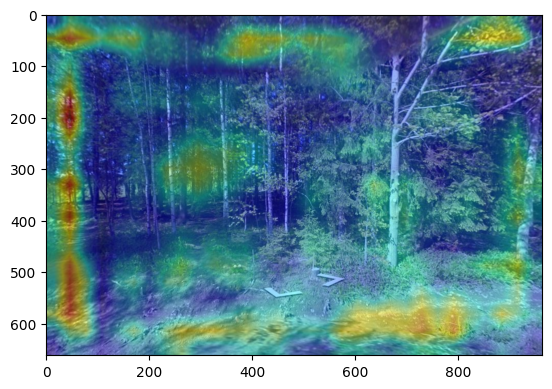

1/1 [==============================] - 0s 21ms/step


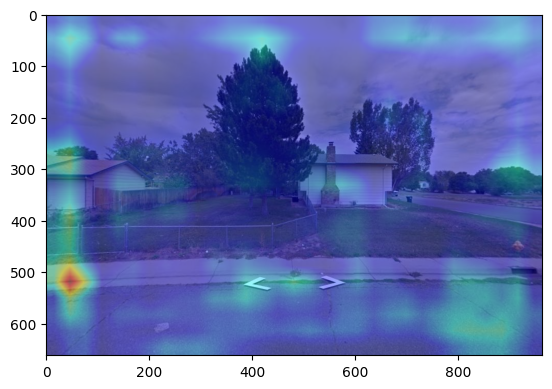

1/1 [==============================] - 0s 27ms/step


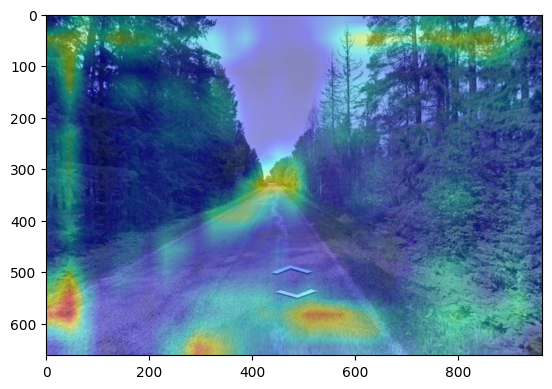

1/1 [==============================] - 0s 20ms/step


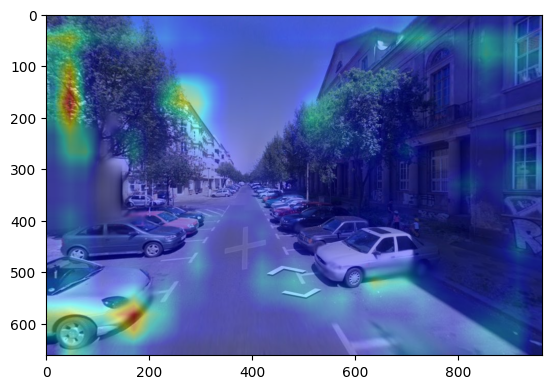

1/1 [==============================] - 0s 22ms/step


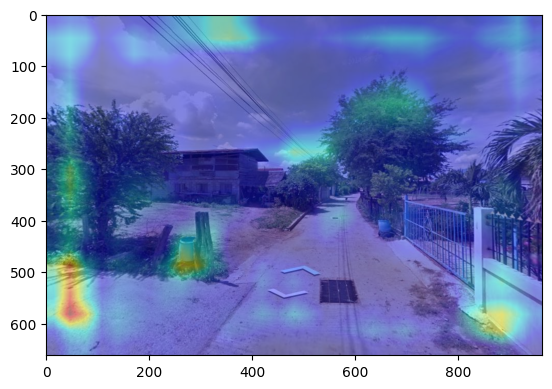

1/1 [==============================] - 0s 29ms/step


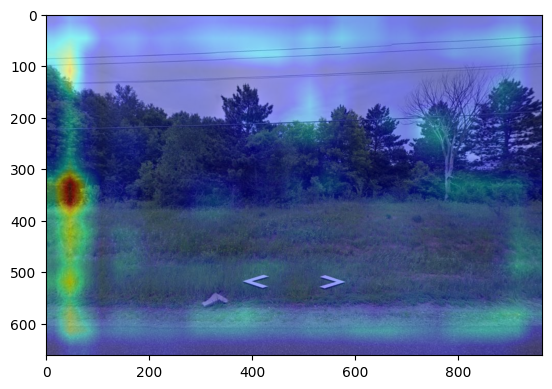

1/1 [==============================] - 0s 21ms/step


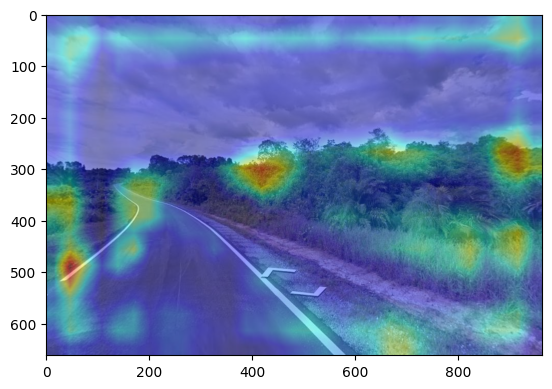

1/1 [==============================] - 0s 23ms/step


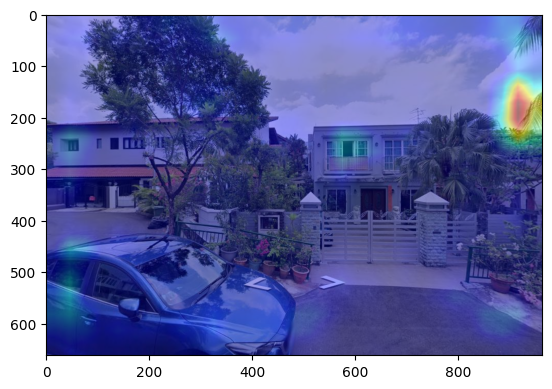

1/1 [==============================] - 0s 20ms/step


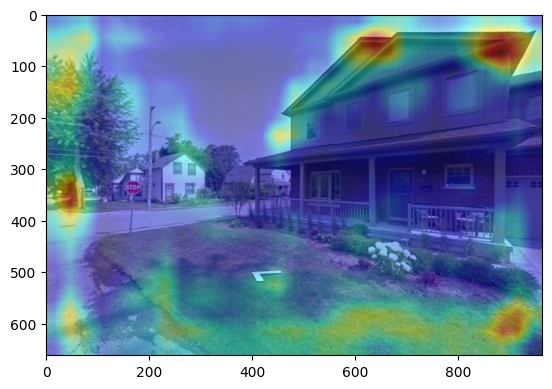

1/1 [==============================] - 0s 21ms/step


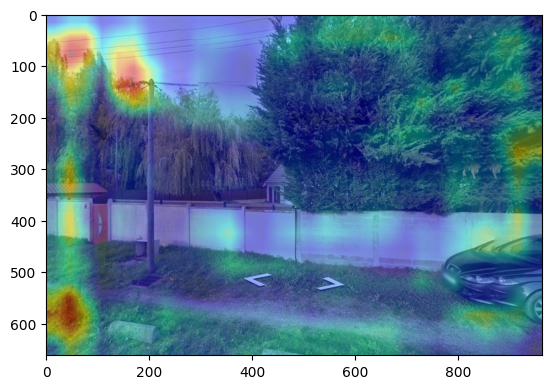

1/1 [==============================] - 0s 20ms/step


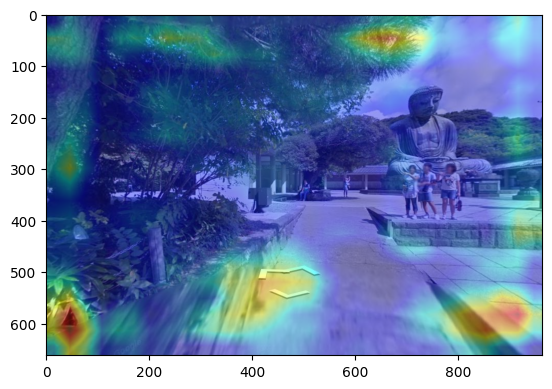

1/1 [==============================] - 0s 27ms/step


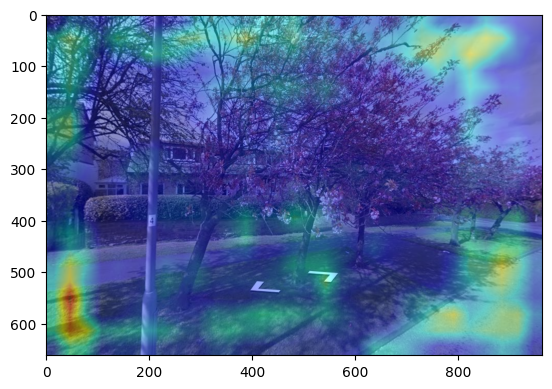

1/1 [==============================] - 0s 31ms/step


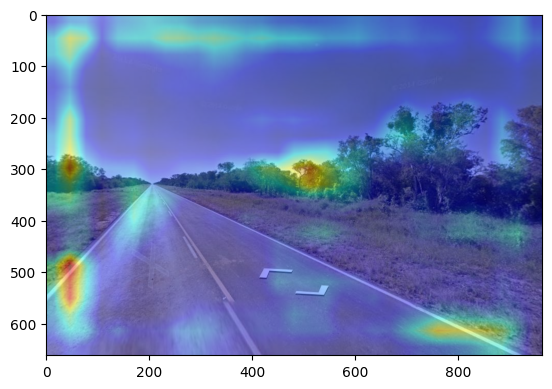

In [15]:
def plot_cam(image, model, class_index):
    """Plot the class activation map of the given image and model for the given class index"""
    # get the model predictions
    base_model_outputs, predictions = model.predict(np.expand_dims(image, axis=0))
    # shape: (1, 7, 7, 1280) and (1, 124)
    # Compute Class Activation Map (CAM) by multiplying the output of the last convolutional layer with the weights of the last dense layer
    cam = np.matmul(base_model_outputs[0], model.get_weights()[-2])
    # Upsample the CAM to the size of the input image
    cam = tf.image.resize(cam, image.shape[:2])
    selected_cam = cam[:, :, class_index]
    # Normalize the CAM
    selected_cam = selected_cam - np.min(selected_cam)
    selected_cam = selected_cam / np.max(selected_cam)
    # Convert the CAM to RGB and apply a colormap using OpenCV
    heatmap = cv2.applyColorMap(np.uint8(255 * selected_cam), cv2.COLORMAP_JET)
    # Apply the heatmap on the original image
    superimposed_img = heatmap * 0.4 + image * 0.6
    # Plot the superimposed image
    plt.imshow(superimposed_img / 255.0)
    plt.show()

for i in range(20):
    plot_cam(train_images_batch[i], multi_output_model, class_names.index("United States"))

However we didn't quiet get the result we had previously hoped for.  
This project was a great learning experience and we hope you enjoyed reading about it as much as we enjoyed working on it.

## Sources:
https://lear.inrialpes.fr/~jegou/data.php Holiday photos datatase
https://static.googleusercontent.com/media/research.google.com/en//pubs/archive/45488.pdf google CNN location paper
https://www.reddit.com/r/photography/comments/s1d3s4/default_image_file_names_from_various_brands/ Default image names
https://www.crcv.ucf.edu/projects/GMCP_Geolocalization/ Google street view dataset
https://www.kaggle.com/datasets/shmalex/instagram-dataset Instagram photo and locations dataset
https://www.kaggle.com/datasets/ubitquitin/geolocation-geoguessr-images-50k Geogeusser dataset
https://www.kaggle.com/datasets/amiralisa/flickr?select=data_10k.csv Flickr dataset